## Explanatory Data Analysis - California Housing Dataset

----------------------------------------------------------

California Housing dataset
--------------------------

**Data Set Characteristics:**

    :Number of Instances: 20640

    :Number of Attributes: 8 numeric, predictive attributes and the target

    :Attribute Information:
        - MedInc        median income in block group
        - HouseAge      median house age in block group
        - AveRooms      average number of rooms per household
        - AveBedrms     average number of bedrooms per household
        - Population    block group population
        - AveOccup      average number of household members
        - Latitude      block group latitude
        - Longitude     block group longitude

    :Missing Attribute Values: None

This dataset was obtained from the StatLib repository.
https://www.dcc.fc.up.pt/~ltorgo/Regression/cal_housing.html

The target variable is the median house value for California districts,
expressed in hundreds of thousands of dollars ($100,000).

This dataset was derived from the 1990 U.S. census, using one row per census
block group. A block group is the smallest geographical unit for which the U.S.
Census Bureau publishes sample data (a block group typically has a population
of 600 to 3,000 people).

An household is a group of people residing within a home. Since the average
number of rooms and bedrooms in this dataset are provided per household, these
columns may take surpinsingly large values for block groups with few households
and many empty houses, such as vacation resorts.

It can be downloaded/loaded using the
:func:`sklearn.datasets.fetch_california_housing` function.

.. topic:: References

    - Pace, R. Kelley and Ronald Barry, Sparse Spatial Autoregressions,
      Statistics and Probability Letters, 33 (1997) 291-297

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
from sklearn.datasets import fetch_california_housing
import sweetviz as sv

train = pd.read_csv(r'train.csv')
test = pd.read_csv(r'test.csv')
df_ = fetch_california_housing()

print(df_.keys())

dict_keys(['data', 'target', 'frame', 'target_names', 'feature_names', 'DESCR'])


In [2]:
print('Target: ',df_['target_names'])
print('Features: ',df_['feature_names'])

Target:  ['MedHouseVal']
Features:  ['MedInc', 'HouseAge', 'AveRooms', 'AveBedrms', 'Population', 'AveOccup', 'Latitude', 'Longitude']


In [3]:
# print(df_['DESCR'])

In [4]:
train['train/test'] = ['train' for i in range(len(train))]
test['train/test'] = ['test' for i in range(len(test))]

df = pd.concat([train,test],axis=0)
df = df.reset_index(drop=True)
df.head()

,id,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,MedHouseVal,train/test
0,0,2.3859,15.0,3.827160,1.112100,1280.0,2.486989,34.60,-120.12,0.980,train
1,1,3.7188,17.0,6.013373,1.054217,1504.0,3.813084,38.69,-121.22,0.946,train
2,2,4.7750,27.0,6.535604,1.103175,1061.0,2.464602,34.71,-120.45,1.576,train
3,3,2.4138,16.0,3.350203,0.965432,1255.0,2.089286,32.66,-117.09,1.336,train
4,4,3.7500,52.0,4.284404,1.069246,1793.0,1.604790,37.80,-122.41,4.500,train


In [5]:
## Real data from California Housing
cal_house = pd.concat([pd.DataFrame(df_['data']),pd.DataFrame(df_['target'])],axis=1)
cal_house.columns = ['MedInc', 'HouseAge', 'AveRooms', 'AveBedrms', 'Population', 'AveOccup', 'Latitude', 'Longitude', 'MedHouseVal']
cal_house.head()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,MedHouseVal
0,8.3252,41.0,6.984127,1.023810,322.0,2.555556,37.88,-122.23,4.526
1,8.3014,21.0,6.238137,0.971880,2401.0,2.109842,37.86,-122.22,3.585
2,7.2574,52.0,8.288136,1.073446,496.0,2.802260,37.85,-122.24,3.521
3,5.6431,52.0,5.817352,1.073059,558.0,2.547945,37.85,-122.25,3.413
4,3.8462,52.0,6.281853,1.081081,565.0,2.181467,37.85,-122.25,3.422


### Simple automated EDA

/Users/nikossofias/miniconda3/envs/env3_5_clone_v01/lib/python3.8/site-packages/sweetviz/dataframe_report.py:74: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  all_source_names = [cur_name for cur_name, cur_series in source_df.iteritems()]
/Users/nikossofias/miniconda3/envs/env3_5_clone_v01/lib/python3.8/site-packages/sweetviz/dataframe_report.py:109: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  filtered_series_names_in_source = [cur_name for cur_name, cur_series in source_df.iteritems()


                                             |          | [  0%]   00:00 -> (? left)

/Users/nikossofias/miniconda3/envs/env3_5_clone_v01/lib/python3.8/site-packages/sweetviz/series_analyzer_numeric.py:25: FutureWarning: The 'mad' method is deprecated and will be removed in a future version. To compute the same result, you may do `(df - df.mean()).abs().mean()`.
  stats["mad"] = series.mad()
/Users/nikossofias/miniconda3/envs/env3_5_clone_v01/lib/python3.8/site-packages/sweetviz/series_analyzer_numeric.py:25: FutureWarning: The 'mad' method is deprecated and will be removed in a future version. To compute the same result, you may do `(df - df.mean()).abs().mean()`.
  stats["mad"] = series.mad()
/Users/nikossofias/miniconda3/envs/env3_5_clone_v01/lib/python3.8/site-packages/sweetviz/series_analyzer_numeric.py:25: FutureWarning: The 'mad' method is deprecated and will be removed in a future version. To compute the same result, you may do `(df - df.mean()).abs().mean()`.
  stats["mad"] = series.mad()
/Users/nikossofias/miniconda3/envs/env3_5_clone_v01/lib/python3.8/site-pa

Report Data EDA.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.



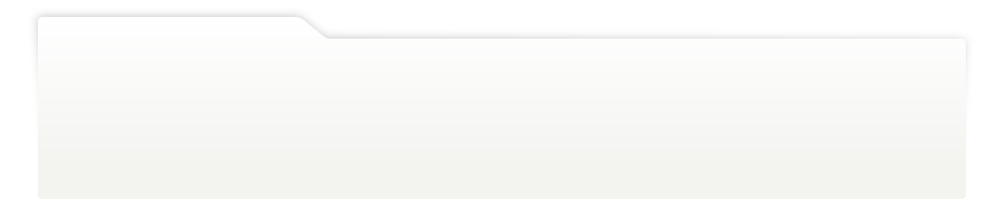
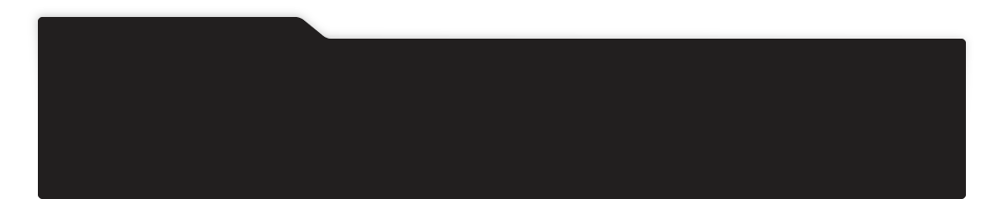
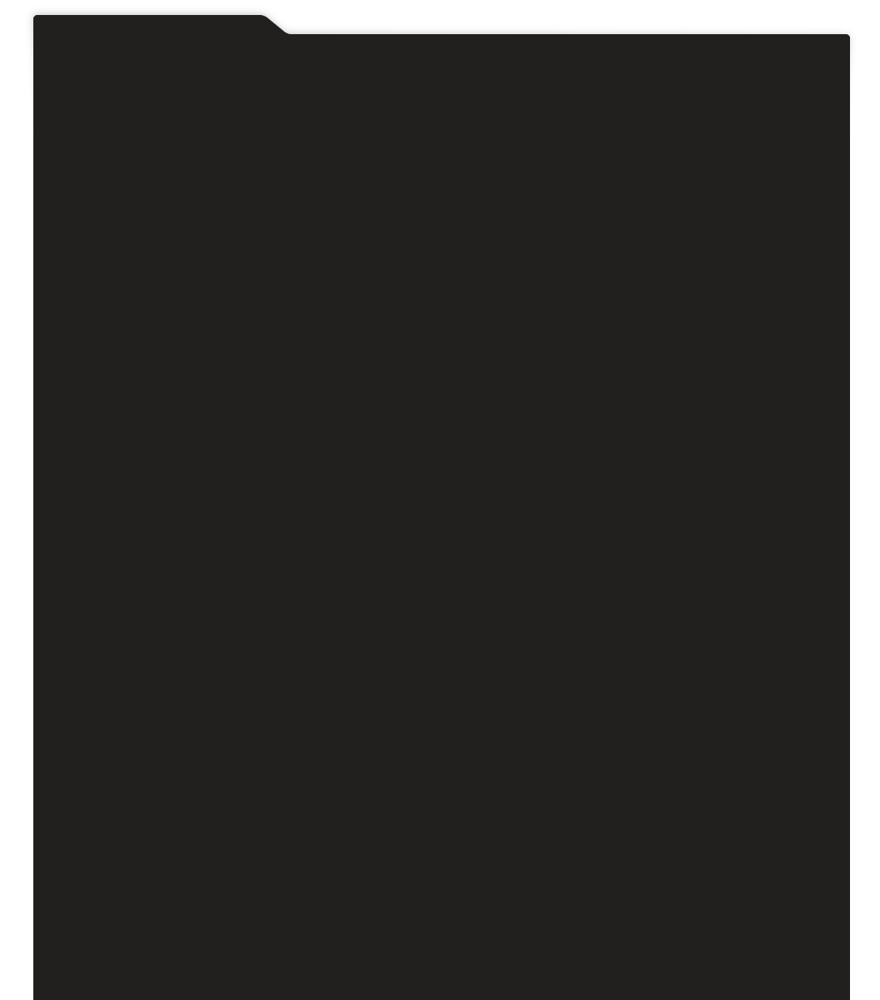
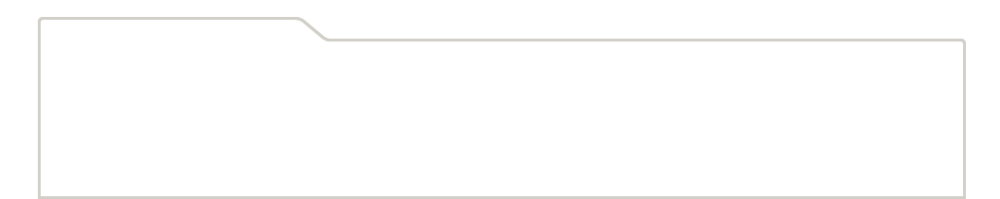
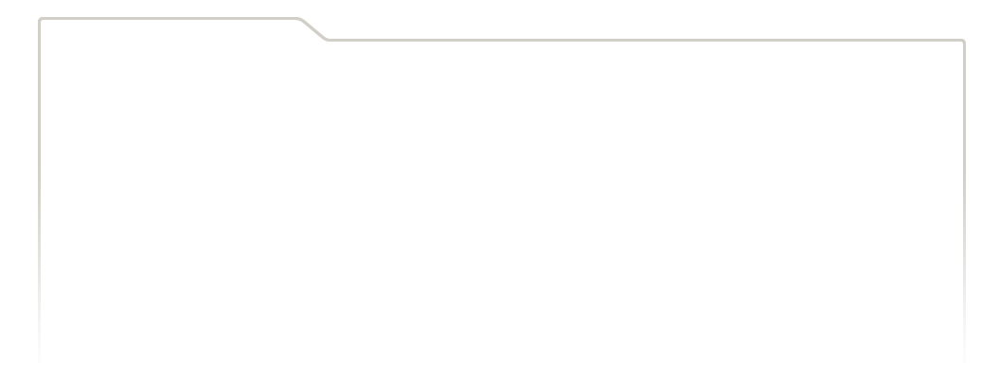
...
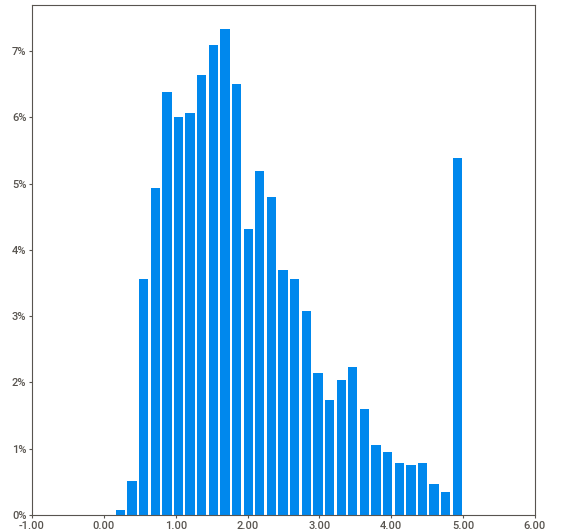
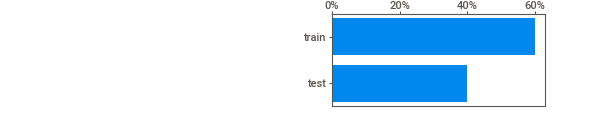
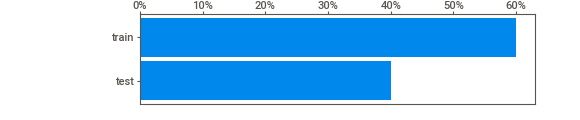
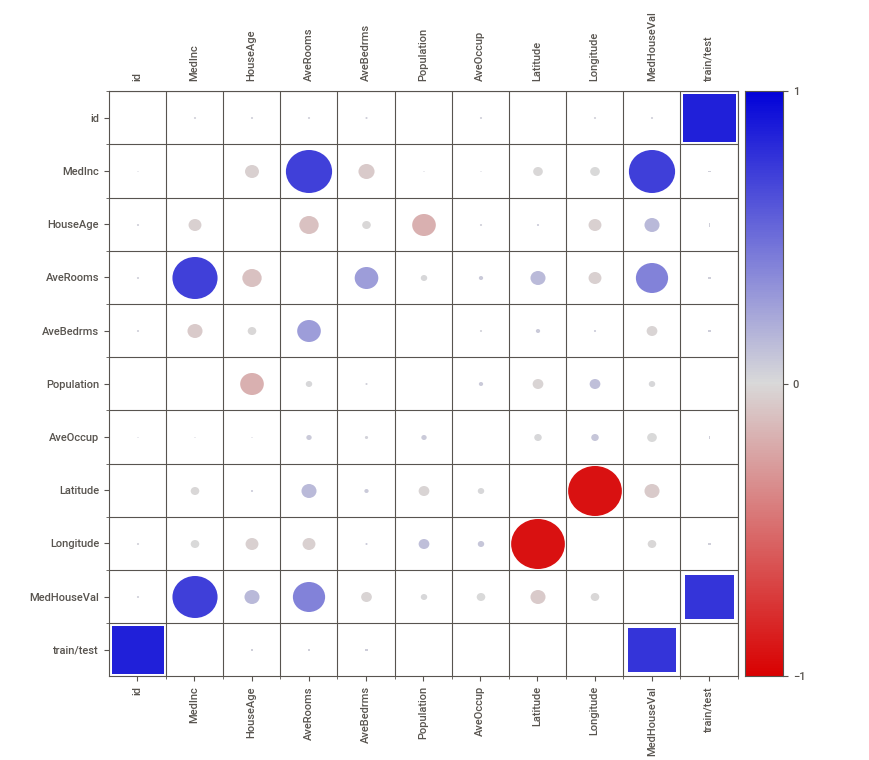
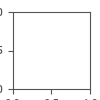

In [6]:
analyze_report = sv.analyze(df, pairwise_analysis="on")
analyze_report.show_html('Data EDA.html', open_browser=True)
analyze_report.show_notebook(w=None, 
                h=None, 
                scale=0.8,
                layout='vertical',
                filepath=None)

/Users/nikossofias/miniconda3/envs/env3_5_clone_v01/lib/python3.8/site-packages/sweetviz/dataframe_report.py:74: FutureWarning:

iteritems is deprecated and will be removed in a future version. Use .items instead.

/Users/nikossofias/miniconda3/envs/env3_5_clone_v01/lib/python3.8/site-packages/sweetviz/dataframe_report.py:109: FutureWarning:

iteritems is deprecated and will be removed in a future version. Use .items instead.



                                             |          | [  0%]   00:00 -> (? left)

/Users/nikossofias/miniconda3/envs/env3_5_clone_v01/lib/python3.8/site-packages/sweetviz/series_analyzer_numeric.py:25: FutureWarning:

The 'mad' method is deprecated and will be removed in a future version. To compute the same result, you may do `(df - df.mean()).abs().mean()`.

/Users/nikossofias/miniconda3/envs/env3_5_clone_v01/lib/python3.8/site-packages/sweetviz/series_analyzer_numeric.py:25: FutureWarning:

The 'mad' method is deprecated and will be removed in a future version. To compute the same result, you may do `(df - df.mean()).abs().mean()`.

/Users/nikossofias/miniconda3/envs/env3_5_clone_v01/lib/python3.8/site-packages/sweetviz/series_analyzer_numeric.py:25: FutureWarning:

The 'mad' method is deprecated and will be removed in a future version. To compute the same result, you may do `(df - df.mean()).abs().mean()`.

/Users/nikossofias/miniconda3/envs/env3_5_clone_v01/lib/python3.8/site-packages/sweetviz/series_analyzer_numeric.py:25: FutureWarning:

The 'mad' method is d


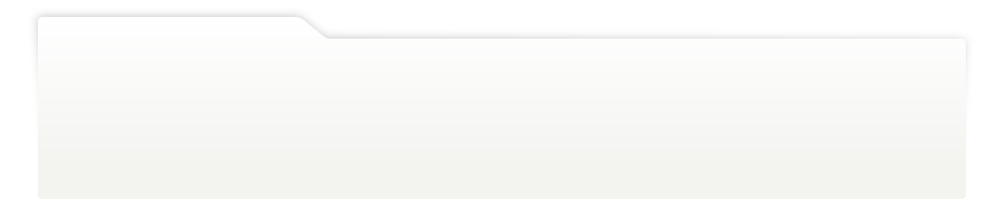
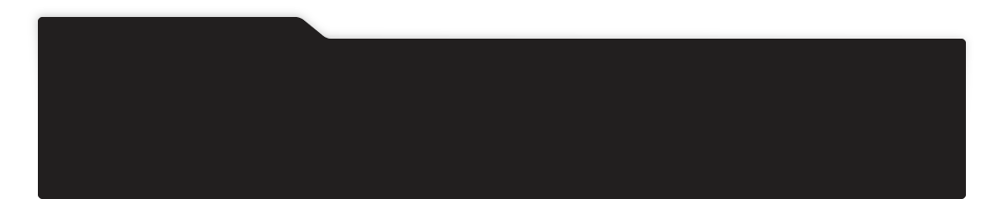
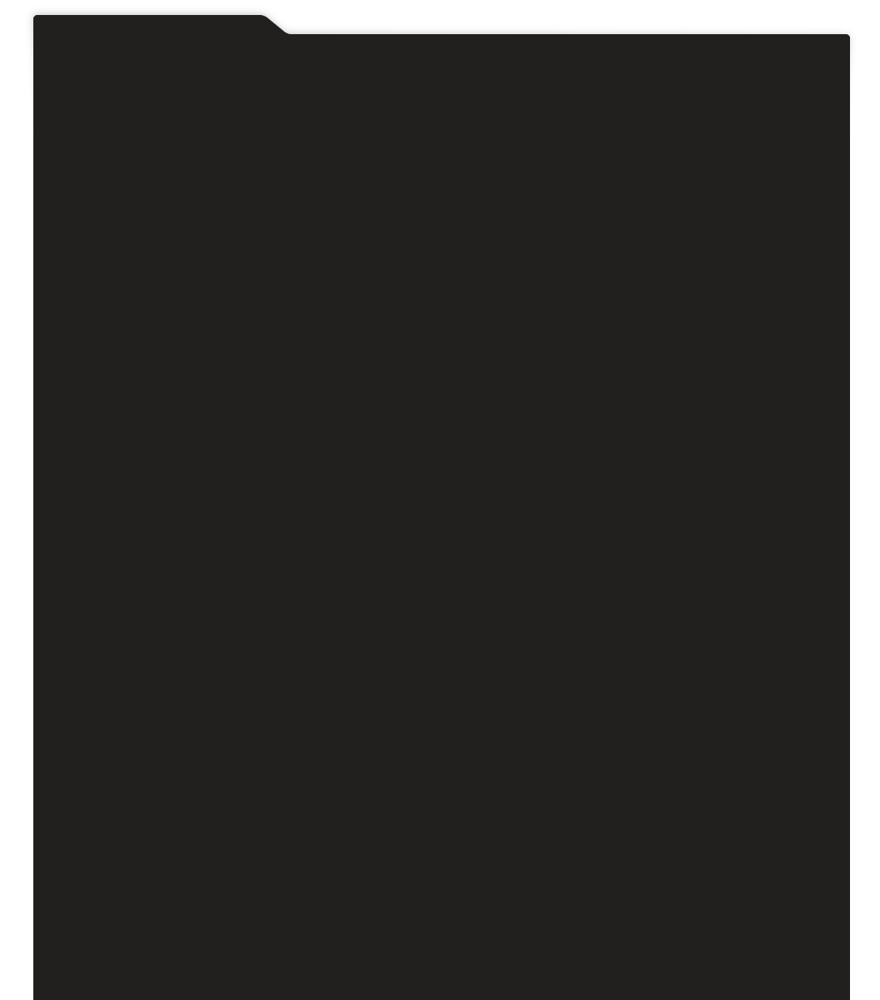
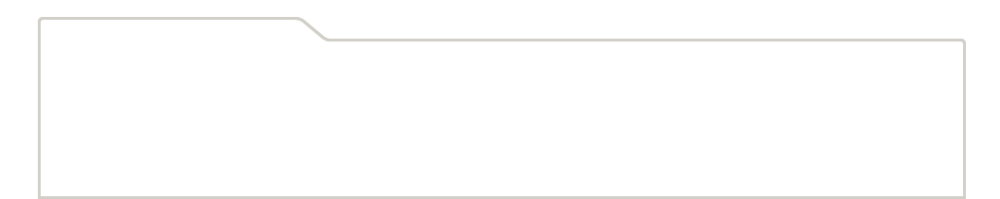
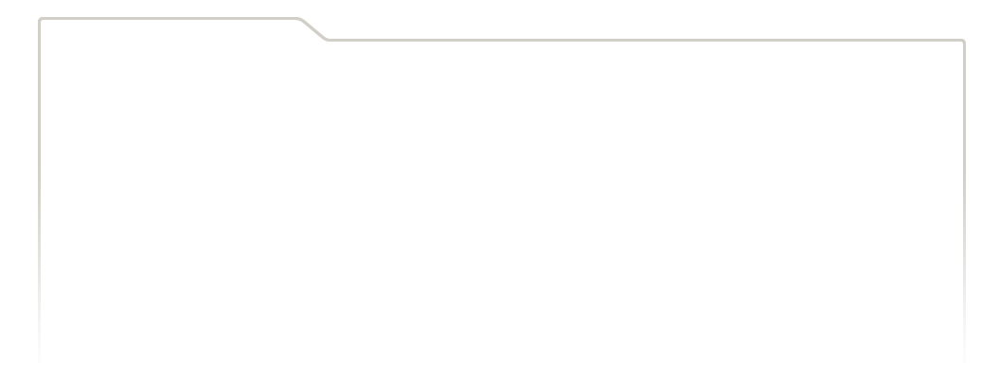
...
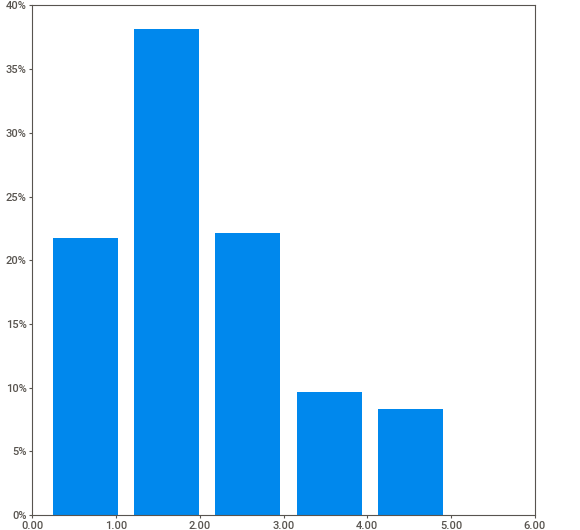
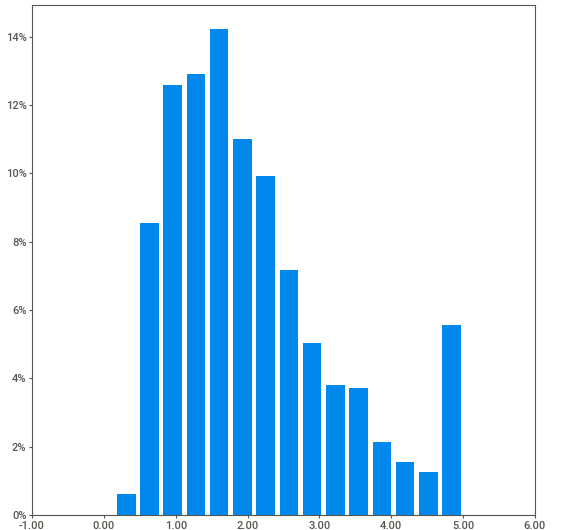
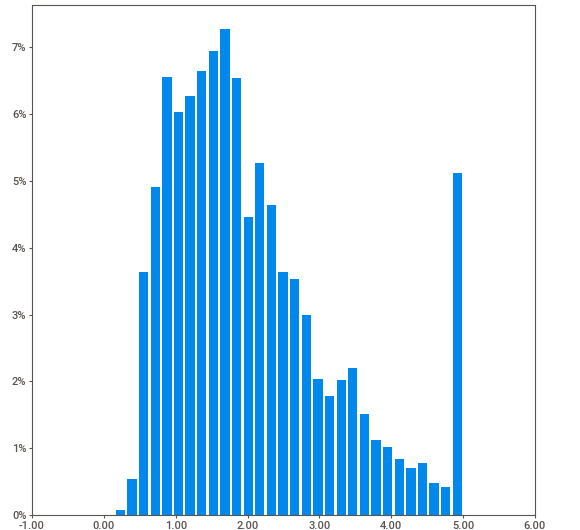
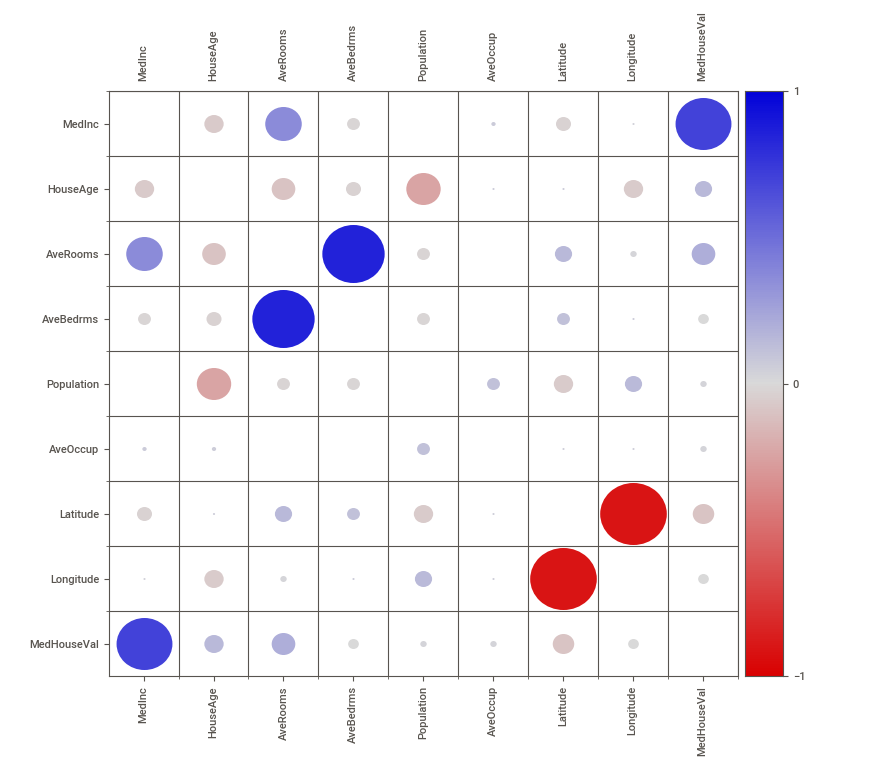
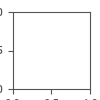

In [21]:
analyze_report = sv.analyze(cal_house, pairwise_analysis="on")
# analyze_report.show_html('Data EDA.html', open_browser=True)
analyze_report.show_notebook(w=None, 
                h=None, 
                scale=0.8,
                layout='vertical',
                filepath=None)

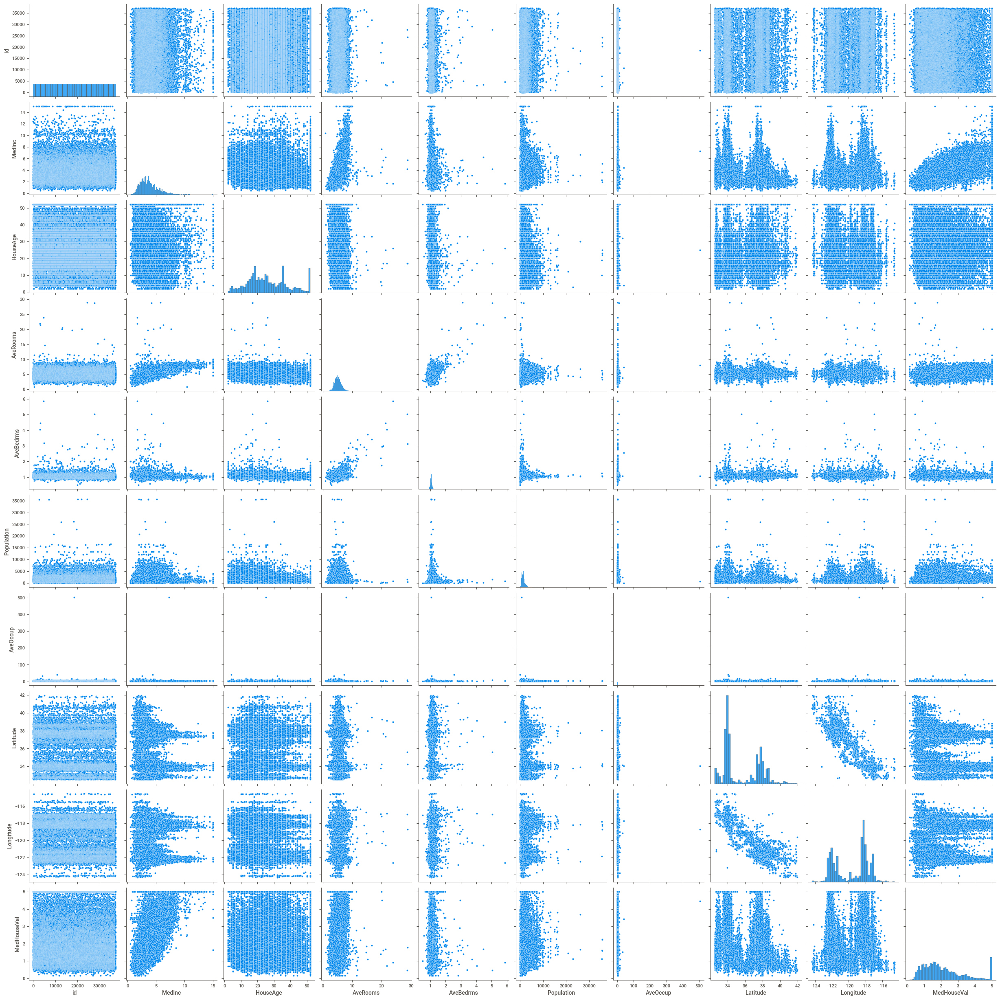

In [7]:
sns.pairplot(df[df['train/test']=='train'])

Conclusions from the analysis:
- 

The MeanHouseVal column contains two peaks arround 2 coordinates. From the analysis these coordinates represent the 2 large cities of California. (LA and San Fransisco)

In [41]:
LA_coords = pd.DataFrame([34.0522,-118.243683]).T
LA_coords.columns = ['Latitude','Longitude']

SF_coords = pd.DataFrame([37.773972,-122.431297]).T
SF_coords.columns = ['Latitude','Longitude']

center_of_mass_coords = pd.DataFrame([36.114647 , -115.172813]).T
center_of_mass_coords.columns = ['Latitude','Longitude']

In [42]:
## Plot locations of houses
import plotly.express as px

fig=px.scatter_geo()
fig1 = px.scatter_geo(df, lat='Latitude', lon='Longitude',)
fig2 = px.scatter_geo(LA_coords,lat='Latitude', lon='Longitude')
fig3 = px.scatter_geo(SF_coords,lat='Latitude', lon='Longitude')
fig4 = px.scatter_geo(center_of_mass_coords,lat='Latitude', lon='Longitude')
# fig.update layout (title = 'Significant Earthquakes, 1965-2016', title x=1)
fig.add_traces(fig1._data)
fig.add_traces(fig2._data)
fig.add_traces(fig3._data)
fig.add_traces(fig4._data)
fig.data[2].marker.color = 'rgba(255,0,0,1)'
fig.data[3].marker.color = 'rgba(255,0,0,1)'
fig.data[4].marker.color = 'rgba(255,0,0,1)'
fig.show()
# fig2.show()

/var/folders/27/fgdmpq1d4v96kxx075vmm_380000gn/T/ipykernel_3223/3537093315.py:4: MatplotlibDeprecationWarning:

Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().



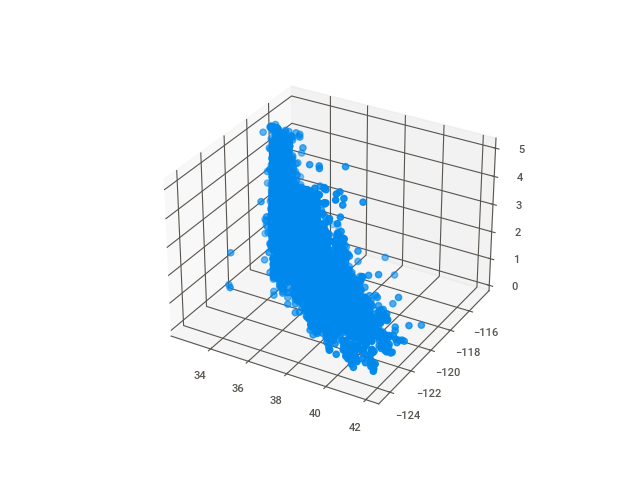

In [10]:
%matplotlib widget

fig = plt.figure()
ax = fig.gca(projection='3d')
ax.scatter(df['Latitude'].values, df['Longitude'].values, df['MedHouseVal'].values)

In [11]:
%matplotlib inline

We conclude that using synthetic dataset there are many houses that are on the sea which is not reasonable. For that reason we should check if there artificial houses in the test set

In [16]:
fig2 = px. scatter_geo(cal_house, lat='Latitude', lon='Longitude',)
# fig.update layout (title = 'Significant Earthquakes, 1965-2016', title x=1)
fig2.show()

Since there are also artificial houses in the test set we should keep them in our analysis because the submisssion dataset will may have these artificial houses

In [17]:
fig3 = px. scatter_geo(df[df['train/test'] == 'test'], lat='Latitude', lon='Longitude',)
# fig.update layout (title = 'Significant Earthquakes, 1965-2016', title x=1)
fig3.show()

In [18]:
df.loc[0,'Latitude']

34.6

We create a feature that computes the euclidean distance of each house of the dataset from the city centers (LA & San Fransisco)

In [54]:
import math
  
def dot(v,w):
    x,y = v
    X,Y = w
    return x*X + y*Y
  
def length(v):
    x,y = v
    return math.sqrt(x*x + y*y)
  
def vector(b,e):
    x,y = b
    X,Y = e
    return (X-x, Y-y)
  
def unit(v):
    x,y = v
    mag = length(v)
    return (x/mag, y/mag)
  
def distance(p0,p1):
    return length(vector(p0,p1))
  
def scale(v,sc):
    x,y = v
    return (x * sc, y * sc)
  
def add(v,w):
    x,y = v
    X,Y = w
    return (x+X, y+Y)

def pnt2line(pnt, start, end):
    line_vec = vector(start, end)
    pnt_vec = vector(start, pnt)
    line_len = length(line_vec)
    line_unitvec = unit(line_vec)
    pnt_vec_scaled = scale(pnt_vec, 1.0/line_len)
    t = dot(line_unitvec, pnt_vec_scaled)    
    if t < 0.0:
        t = 0.0
    elif t > 1.0:
        t = 1.0
    nearest = scale(line_vec, t)
    dist = distance(nearest, pnt_vec)
    nearest = add(nearest, start)
    return (dist, nearest)

In [59]:
LA_coords['Latitude'].values[0]

34.0522

In [60]:
pnt2line((df.loc[0,'Latitude'],df.loc[0,'Longitude']), (LA_coords['Latitude'].values[0],LA_coords['Longitude'].values[0]),
            (SF_coords['Latitude'].values[0],SF_coords['Longitude'].values[0]))

(0.8369963699884841, (35.2256198013577, -119.5639759110227))

In [70]:
import math

def euclidean_distance(idx,df,df_center):
    return math.dist([df.loc[idx,'Latitude'], df.loc[idx,'Longitude']], [df_center['Latitude'], df_center['Longitude']])

In [71]:
eucl_distance = []
# eucl_distance_SF = []
for idx in range(len(df)):
    # eucl_distance.append(pnt2line((df.loc[idx,'Latitude'],df.loc[idx,'Longitude']), (LA_coords['Latitude'].values[0],LA_coords['Longitude'].values[0]),
    #         (SF_coords['Latitude'].values[0],SF_coords['Longitude'].values[0])))
    eucl_distance.append((euclidean_distance(idx,df,LA_coords) + euclidean_distance(idx,df,SF_coords)) / 2)
    # eucl_distance_SF.append(euclidean_distance(idx,df,SF_coords) )

df['eucl_distance'] = eucl_distance
# df['eucl_distance_SF'] = eucl_distance_SF

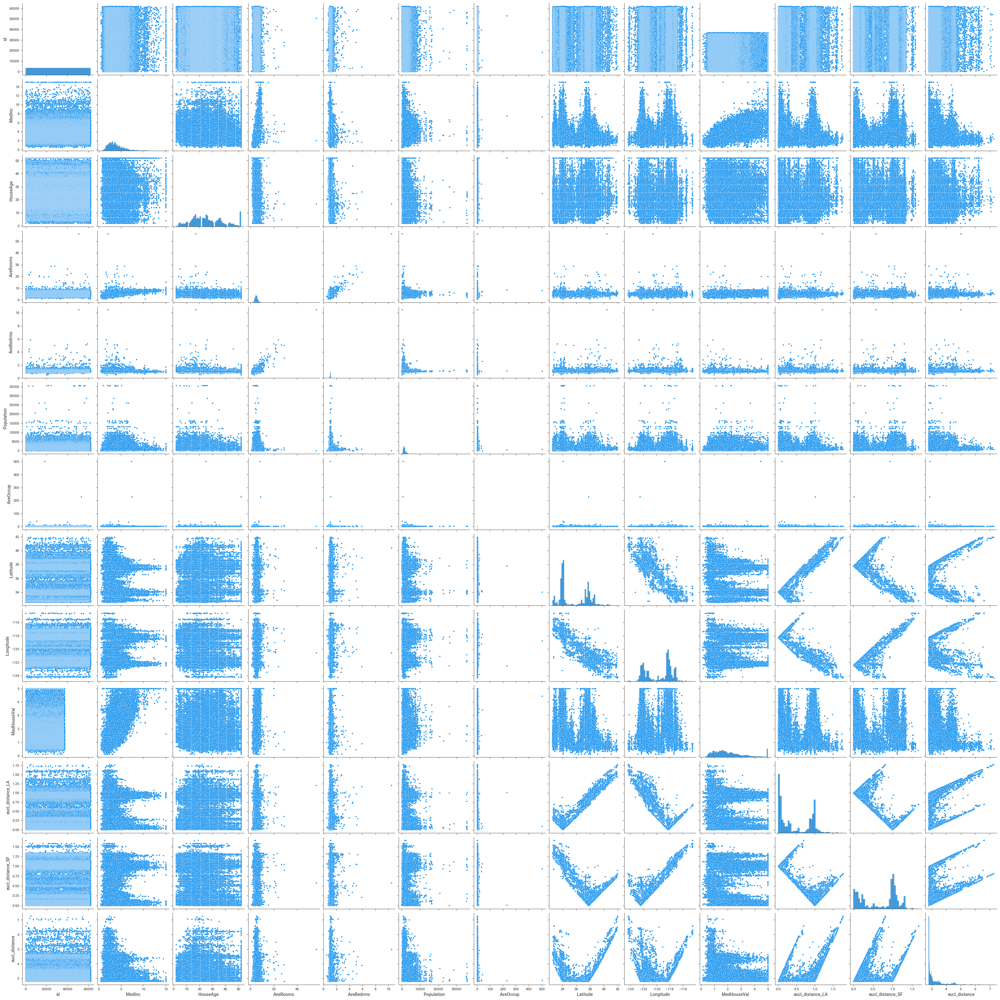

In [72]:
sns.pairplot(df)

In [74]:
pd.set_option('display.max_columns', 200)
pd.set_option('display.max_rows', df.shape[0])

corr = df.dropna().corr('pearson')
corr.style.background_gradient(cmap='coolwarm').set_precision(2)

/var/folders/27/fgdmpq1d4v96kxx075vmm_380000gn/T/ipykernel_3223/2686822064.py:4: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.

/var/folders/27/fgdmpq1d4v96kxx075vmm_380000gn/T/ipykernel_3223/2686822064.py:5: FutureWarning:

this method is deprecated in favour of `Styler.format(precision=..)`



,id,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,MedHouseVal,eucl_distance_LA,eucl_distance_SF,eucl_distance
id,1.00,0.00,-0.00,-0.00,-0.00,0.00,-0.00,-0.00,0.00,-0.00,-0.00,0.00,0.00
MedInc,0.00,1.00,-0.08,0.70,-0.13,-0.01,-0.00,-0.06,-0.04,0.70,-0.04,-0.04,-0.17
HouseAge,-0.00,-0.08,1.00,-0.16,-0.06,-0.24,-0.00,0.02,-0.09,0.10,-0.02,-0.09,-0.23
AveRooms,-0.00,0.70,-0.16,1.00,0.17,-0.04,0.02,0.10,-0.09,0.37,0.12,-0.09,0.06
AveBedrms,-0.00,-0.13,-0.06,0.17,1.00,-0.01,-0.01,0.03,0.02,-0.07,0.02,0.02,0.08
Population,0.00,-0.01,-0.24,-0.04,-0.01,1.00,0.02,-0.07,0.07,-0.04,-0.07,0.06,-0.00
AveOccup,-0.00,-0.00,-0.00,0.02,-0.01,0.02,1.00,-0.03,0.04,-0.05,-0.04,0.03,-0.01
Latitude,-0.00,-0.06,0.02,0.10,0.03,-0.07,-0.03,1.00,-0.94,-0.12,0.94,-0.93,-0.09
Longitude,0.00,-0.04,-0.09,-0.09,0.02,0.07,0.04,-0.94,1.00,-0.06,-0.91,0.98,0.26
MedHouseVal,-0.00,0.70,0.10,0.37,-0.07,-0.04,-0.05,-0.12,-0.06,1.00,-0.10,-0.04,-0.31


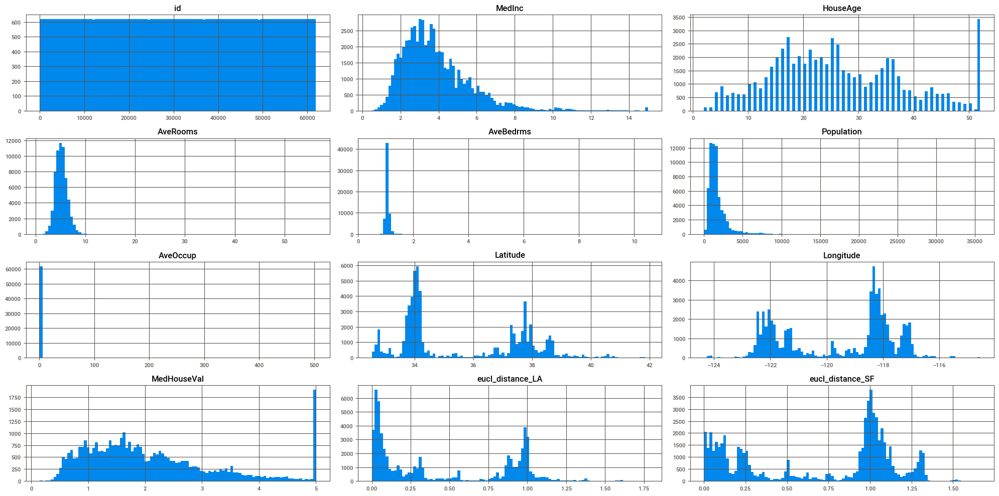

In [69]:
df.hist(figsize=(20,10),bins=100)
plt.tight_layout()

In [76]:
df.columns

Index(['id', 'MedInc', 'HouseAge', 'AveRooms', 'AveBedrms', 'Population',
       'AveOccup', 'Latitude', 'Longitude', 'MedHouseVal', 'train/test',
       'eucl_distance_LA', 'eucl_distance_SF', 'eucl_distance'],
      dtype='object')

In [78]:
import FRUFS as fr

model_frufs_generated = fr.FRUFS(
        model_r = fr.LGBMRegressor(random_state=42),
        model_c = fr.LGBMClassifier(random_state=42),
        k=0.5,
        n_jobs=-1
    )
model_frufs_generated.fit(df[['MedInc', 'HouseAge', 'AveRooms', 'AveBedrms', 'Population',
       'AveOccup', 'Latitude', 'Longitude','eucl_distance_LA', 'eucl_distance_SF', 'eucl_distance']])

Progress bar: 100%|██████████| 11/11 [00:02<00:00,  5.26it/s]


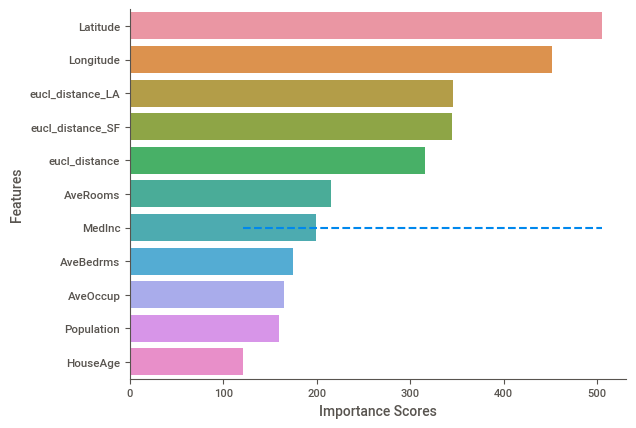

In [79]:
model_frufs_generated.feature_importance() # LGM model

In [81]:
df.head()

,id,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,MedHouseVal,train/test,eucl_distance_LA,eucl_distance_SF,eucl_distance
0,0,2.3859,15.0,3.827160,1.112100,1280.0,2.486989,34.60,-120.12,0.980,train,0.348890,0.700824,2.940497
1,1,3.7188,17.0,6.013373,1.054217,1504.0,3.813084,38.69,-121.22,0.946,train,0.983617,0.271071,3.514676
2,2,4.7750,27.0,6.535604,1.103175,1061.0,2.464602,34.71,-120.45,1.576,train,0.410942,0.651277,2.975525
3,3,2.4138,16.0,3.350203,0.965432,1255.0,2.089286,32.66,-117.09,1.336,train,0.322732,1.319906,4.601417
4,4,3.7500,52.0,4.284404,1.069246,1793.0,1.604790,37.80,-122.41,4.500,train,1.000263,0.006003,2.818788


In [84]:
train = df[df['train/test']=='train'][['MedInc', 'HouseAge', 'AveRooms', 'AveBedrms', 'Population', 'AveOccup', 'Latitude', 'Longitude',
                                          'eucl_distance_LA', 'eucl_distance_SF', 'eucl_distance','MedHouseVal']]

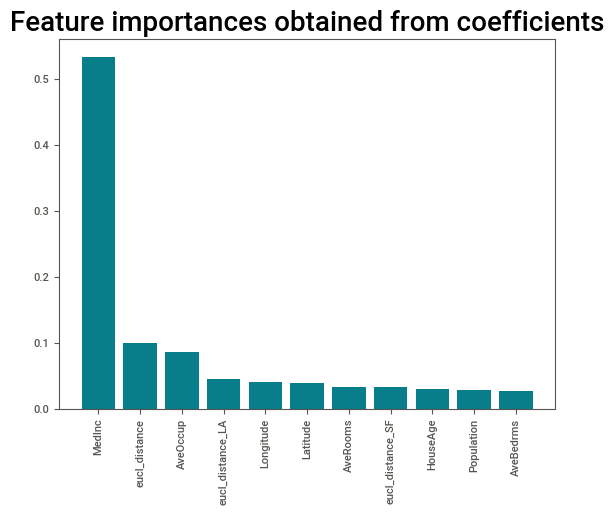

In [87]:
from sklearn.ensemble import RandomForestRegressor
model = RandomForestRegressor()
# fit the model
model.fit(train[['MedInc', 'HouseAge', 'AveRooms', 'AveBedrms', 'Population', 'AveOccup', 'Latitude', 'Longitude',
                        'eucl_distance_LA', 'eucl_distance_SF', 'eucl_distance']], train['MedHouseVal'])
# get importance
importances = pd.DataFrame(data={
    'Attribute': ['MedInc', 'HouseAge', 'AveRooms', 'AveBedrms', 'Population', 'AveOccup', 'Latitude', 'Longitude','eucl_distance_LA', 'eucl_distance_SF', 'eucl_distance'],
    'Importance': model.feature_importances_
})
importances = importances.sort_values(by='Importance', ascending=False)
# summarize feature importance
plt.bar(x=importances['Attribute'], height=importances['Importance'], color='#087E8B')
plt.title('Feature importances obtained from coefficients', size=20)
plt.xticks(rotation='vertical')
plt.show()

## Training

In [136]:
include_new_feats = True
include_eucl_dist_only = True


if (include_new_feats == True) & (include_new_feats == False):
    train = df[df['train/test']=='train']
    test = df[df['train/test']=='test']

    X = train[['MedInc', 'HouseAge', 'AveRooms', 'AveBedrms', 'Population', 'AveOccup', 'Latitude', 'Longitude',
                                            'eucl_distance_LA', 'eucl_distance_SF', 'eucl_distance']]
    y = train['MedHouseVal'] 

    X_test = test[['MedInc', 'HouseAge', 'AveRooms', 'AveBedrms', 'Population', 'AveOccup', 'Latitude', 'Longitude',
                                            'eucl_distance_LA', 'eucl_distance_SF', 'eucl_distance']]
elif (include_new_feats == True) & (include_eucl_dist_only == True):
    train = df[df['train/test']=='train']
    test = df[df['train/test']=='test']

    X = train[['MedInc', 'HouseAge', 'AveRooms', 'AveBedrms', 'Population', 'AveOccup', 'Latitude', 'Longitude', 'eucl_distance']]
    y = train['MedHouseVal'] 

    X_test = test[['MedInc', 'HouseAge', 'AveRooms', 'AveBedrms', 'Population', 'AveOccup', 'Latitude', 'Longitude','eucl_distance']]                                            
else:
    train = df[df['train/test']=='train']
    test = df[df['train/test']=='test']

    X = train[['MedInc', 'HouseAge', 'AveRooms', 'AveBedrms', 'Population', 'AveOccup', 'Latitude', 'Longitude']]
    y = train['MedHouseVal'] 

    X_test = test[['MedInc', 'HouseAge', 'AveRooms', 'AveBedrms', 'Population', 'AveOccup', 'Latitude', 'Longitude']]


In [134]:
from sklearn.model_selection import KFold
import lightgbm as lgb
import gc

def rmse(predictions, targets):
    return np.sqrt(((predictions - targets) ** 2).mean())

def f_importance_plot(f_imp):
    fig = plt.figure(figsize = (15, 0.35*len(f_imp)))
    plt.title('Feature importances', size=25, y=1.05, 
              fontname='Calibri', fontweight='bold', color='#444444')
    a = sns.barplot(data=f_imp, x='avg_imp', y='feature', 
                    palette='Blues_d', linestyle="-", 
                    linewidth=1, edgecolor="black")
    plt.xlabel('')
    plt.xticks([])
    plt.ylabel('')
    plt.yticks(size=11, color='#444444')
    
    for j in ['right', 'top', 'bottom']:
        a.spines[j].set_visible(False)
    for j in ['left']:
        a.spines[j].set_linewidth(0.5)
    plt.show()

## Add distance feature


--- FOLD 1 ---
[1]	train's rmse: 1.14999	val's rmse: 1.15277
[2]	train's rmse: 1.14245	val's rmse: 1.14541
[3]	train's rmse: 1.13501	val's rmse: 1.13816
[4]	train's rmse: 1.12765	val's rmse: 1.13101


/Users/nikossofias/miniconda3/envs/env3_5_clone_v01/lib/python3.8/site-packages/lightgbm/engine.py:239: UserWarning:

'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



[5]	train's rmse: 1.12048	val's rmse: 1.12401
[6]	train's rmse: 1.11398	val's rmse: 1.11769
[7]	train's rmse: 1.10688	val's rmse: 1.1108
[8]	train's rmse: 1.10069	val's rmse: 1.10482
[9]	train's rmse: 1.09366	val's rmse: 1.09805
[10]	train's rmse: 1.08674	val's rmse: 1.09138
[11]	train's rmse: 1.07994	val's rmse: 1.08477
[12]	train's rmse: 1.07328	val's rmse: 1.07834
[13]	train's rmse: 1.06664	val's rmse: 1.07189
[14]	train's rmse: 1.0601	val's rmse: 1.06557
[15]	train's rmse: 1.05458	val's rmse: 1.06026
[16]	train's rmse: 1.04912	val's rmse: 1.055
[17]	train's rmse: 1.04278	val's rmse: 1.04885
[18]	train's rmse: 1.03646	val's rmse: 1.04277
[19]	train's rmse: 1.03019	val's rmse: 1.03676
[20]	train's rmse: 1.02466	val's rmse: 1.03141
[21]	train's rmse: 1.01859	val's rmse: 1.02558
[22]	train's rmse: 1.01262	val's rmse: 1.0198
[23]	train's rmse: 1.00769	val's rmse: 1.01502
[24]	train's rmse: 1.0025	val's rmse: 1.01001
[25]	train's rmse: 0.99664	val's rmse: 1.00438
[26]	train's rmse: 0.990

/Users/nikossofias/miniconda3/envs/env3_5_clone_v01/lib/python3.8/site-packages/lightgbm/engine.py:239: UserWarning:

'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



[6]	train's rmse: 1.11394	val's rmse: 1.11851
[7]	train's rmse: 1.10688	val's rmse: 1.11154
[8]	train's rmse: 1.10068	val's rmse: 1.10551
[9]	train's rmse: 1.09374	val's rmse: 1.09866
[10]	train's rmse: 1.08688	val's rmse: 1.0919
[11]	train's rmse: 1.08016	val's rmse: 1.08523
[12]	train's rmse: 1.0736	val's rmse: 1.07872
[13]	train's rmse: 1.06705	val's rmse: 1.0722
[14]	train's rmse: 1.06059	val's rmse: 1.06582
[15]	train's rmse: 1.055	val's rmse: 1.0604
[16]	train's rmse: 1.04936	val's rmse: 1.05493
[17]	train's rmse: 1.04306	val's rmse: 1.0487
[18]	train's rmse: 1.0368	val's rmse: 1.04254
[19]	train's rmse: 1.03057	val's rmse: 1.03642
[20]	train's rmse: 1.02505	val's rmse: 1.03105
[21]	train's rmse: 1.01902	val's rmse: 1.02512
[22]	train's rmse: 1.01309	val's rmse: 1.01929
[23]	train's rmse: 1.00821	val's rmse: 1.01458
[24]	train's rmse: 1.00312	val's rmse: 1.00969
[25]	train's rmse: 0.99727	val's rmse: 1.00396
[26]	train's rmse: 0.991523	val's rmse: 0.998292
[27]	train's rmse: 0.98

/Users/nikossofias/miniconda3/envs/env3_5_clone_v01/lib/python3.8/site-packages/lightgbm/engine.py:239: UserWarning:

'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



[5]	train's rmse: 1.12397	val's rmse: 1.11759
[6]	train's rmse: 1.11786	val's rmse: 1.11157
[7]	train's rmse: 1.11083	val's rmse: 1.10465
[8]	train's rmse: 1.10457	val's rmse: 1.09845
[9]	train's rmse: 1.09764	val's rmse: 1.09155
[10]	train's rmse: 1.09082	val's rmse: 1.08479
[11]	train's rmse: 1.08405	val's rmse: 1.07809
[12]	train's rmse: 1.07742	val's rmse: 1.07155
[13]	train's rmse: 1.07083	val's rmse: 1.06505
[14]	train's rmse: 1.06431	val's rmse: 1.05864
[15]	train's rmse: 1.05875	val's rmse: 1.05316
[16]	train's rmse: 1.05306	val's rmse: 1.04751
[17]	train's rmse: 1.04675	val's rmse: 1.04126
[18]	train's rmse: 1.0405	val's rmse: 1.03507
[19]	train's rmse: 1.03433	val's rmse: 1.02896
[20]	train's rmse: 1.02885	val's rmse: 1.02354
[21]	train's rmse: 1.02287	val's rmse: 1.01765
[22]	train's rmse: 1.01696	val's rmse: 1.01181
[23]	train's rmse: 1.01221	val's rmse: 1.00717
[24]	train's rmse: 1.00708	val's rmse: 1.00205
[25]	train's rmse: 1.00131	val's rmse: 0.996345
[26]	train's rmse:

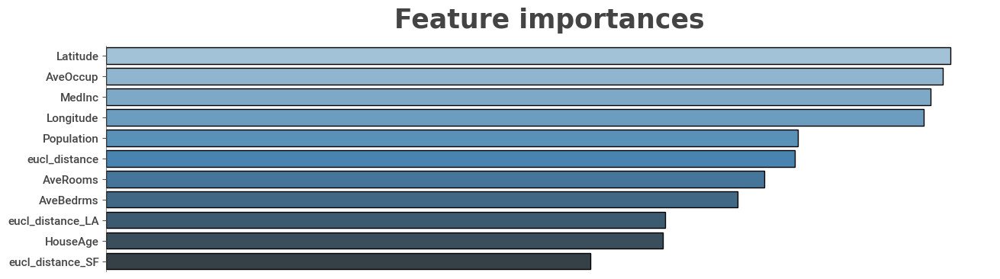

In [132]:
seed = 42
FOLDS = 3

lgb_params = {
    'max_depth': 9,
    'learning_rate': 0.01,
    'min_data_in_leaf': 36, 
    'num_leaves': 100, 
    'feature_fraction': 0.8, 
    'bagging_fraction': 0.89, 
    'bagging_freq': 5, 
    'lambda_l2': 28,
    
    'seed': seed,
    'objective': 'regression',
    'boosting_type': 'gbdt',
    'device': 'cpu', 
    'gpu_platform_id': 0,
    'gpu_device_id': 0,
    'n_jobs': -1,
    'metric': 'rmse',
    'verbose': -1
}

f_imp = pd.DataFrame({'feature': X.columns})
predictions, scores = np.zeros(len(test)), []

k = KFold(n_splits=FOLDS, random_state=seed, shuffle=True)
for fold, (train_idx, val_idx) in enumerate(k.split(X, y)):
    print(f'\n--- FOLD {fold+1} ---')
        
    lgb_train = lgb.Dataset(data=X.iloc[train_idx], 
                            label=y.iloc[train_idx])
    lgb_valid = lgb.Dataset(data=X.iloc[val_idx], 
                            label=y.iloc[val_idx],
                            reference=lgb_train)

    model = lgb.train(params=lgb_params, 
                      train_set=lgb_train, 
                      num_boost_round=50000,
                      valid_sets=[lgb_train, lgb_valid], 
                      valid_names=['train', 'val'],
                      verbose_eval=False,
                      callbacks=[lgb.log_evaluation(),
                                 lgb.early_stopping(100, verbose=False)])
    
    f_imp['fold_'+str(fold+1)] = model.feature_importance()
    b_itr = model.best_iteration
    
    val_preds = model.predict(X.iloc[val_idx], num_iteration=b_itr)
    val_score = rmse(y.iloc[val_idx], val_preds)
    scores.append(val_score)
    
    predictions += model.predict(X_test, num_iteration=b_itr) / FOLDS
    # print(f'--- RMSE: {round(val_score, 6)} | best iteration:{b_itr} ---')
    
    del lgb_train, lgb_valid, val_preds, val_score, model
    gc.collect()

print('*'*45)
print(f'Mean RMSE: {round(np.mean(scores), 6)}')

f_imp['avg_imp'] = f_imp[f_imp.columns[1:]].mean(axis=1)
f_imp.sort_values('avg_imp', ascending=False, inplace=True)
f_importance_plot(f_imp)

## Include only eucl dist feature

In [141]:
seed = 42
FOLDS = 3

lgb_params = {
    'max_depth': 9,
    'learning_rate': 0.01,
    'min_data_in_leaf': 36, 
    'num_leaves': 100, 
    'feature_fraction': 0.8, 
    'bagging_fraction': 0.89, 
    'bagging_freq': 5, 
    'lambda_l2': 28,
    
    'seed': seed,
    'objective': 'regression',
    'boosting_type': 'gbdt',
    'device': 'cpu', 
    'gpu_platform_id': 0,
    'gpu_device_id': 0,
    'n_jobs': -1,
    'metric': 'rmse',
    'verbose': -1
}

f_imp = pd.DataFrame({'feature': X.columns})
predictions, scores = np.zeros(len(test)), []

k = KFold(n_splits=FOLDS, random_state=seed, shuffle=True)
for fold, (train_idx, val_idx) in enumerate(k.split(X, y)):
    print(f'\n--- FOLD {fold+1} ---')
        
    lgb_train = lgb.Dataset(data=X.iloc[train_idx], 
                            label=y.iloc[train_idx])
    lgb_valid = lgb.Dataset(data=X.iloc[val_idx], 
                            label=y.iloc[val_idx],
                            reference=lgb_train)

    model = lgb.train(params=lgb_params, 
                      train_set=lgb_train, 
                      num_boost_round=50000,
                      valid_sets=[lgb_train, lgb_valid], 
                      valid_names=['train', 'val'],
                      verbose_eval=False,
                      callbacks=[lgb.log_evaluation(),
                                 lgb.early_stopping(100, verbose=False)])
                             
    
    f_imp['fold_'+str(fold+1)] = model.feature_importance()
    b_itr = model.best_iteration
    
    val_preds = model.predict(X.iloc[val_idx], num_iteration=b_itr)
    val_score = rmse(y.iloc[val_idx], val_preds)
    scores.append(val_score)
    
    predictions += model.predict(X_test, num_iteration=b_itr) / FOLDS
    # print(f'--- RMSE: {round(val_score, 6)} | best iteration:{b_itr} ---')
    
    del lgb_train, lgb_valid, val_preds, val_score, model
    gc.collect()

print('*'*45)
print(f'Mean RMSE: {round(np.mean(scores), 6)}')

f_imp['avg_imp'] = f_imp[f_imp.columns[1:]].mean(axis=1)
f_imp.sort_values('avg_imp', ascending=False, inplace=True)
f_importance_plot(f_imp)


--- FOLD 1 ---


TypeError: train() missing 1 required positional argument: 'params'

In [140]:
lgbm_preds = predictions.copy()
ss = pd.read_csv(r'sample_submission.csv')
ss['MedHouseVal'] = predictions
ss.to_csv('lgbm_submission.csv', index=False)

## Initial modeling (no add extra feats)


--- FOLD 1 ---
[1]	train's rmse: 1.15021	val's rmse: 1.15294
[2]	train's rmse: 1.14331	val's rmse: 1.14623
[3]	train's rmse: 1.13726	val's rmse: 1.14029
[4]	train's rmse: 1.13026	val's rmse: 1.13349


/Users/nikossofias/miniconda3/envs/env3_5_clone_v01/lib/python3.8/site-packages/lightgbm/engine.py:239: UserWarning:

'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



[5]	train's rmse: 1.12337	val's rmse: 1.12679
[6]	train's rmse: 1.11651	val's rmse: 1.12017
[7]	train's rmse: 1.10952	val's rmse: 1.11336
[8]	train's rmse: 1.10373	val's rmse: 1.10768
[9]	train's rmse: 1.09716	val's rmse: 1.10134
[10]	train's rmse: 1.09117	val's rmse: 1.09555
[11]	train's rmse: 1.08502	val's rmse: 1.08956
[12]	train's rmse: 1.07895	val's rmse: 1.08364
[13]	train's rmse: 1.07261	val's rmse: 1.07753
[14]	train's rmse: 1.06715	val's rmse: 1.07219
[15]	train's rmse: 1.06057	val's rmse: 1.06579
[16]	train's rmse: 1.05438	val's rmse: 1.05983
[17]	train's rmse: 1.04782	val's rmse: 1.05343
[18]	train's rmse: 1.04258	val's rmse: 1.0483
[19]	train's rmse: 1.0366	val's rmse: 1.04253
[20]	train's rmse: 1.03025	val's rmse: 1.03634
[21]	train's rmse: 1.02409	val's rmse: 1.03038
[22]	train's rmse: 1.01985	val's rmse: 1.02637
[23]	train's rmse: 1.01391	val's rmse: 1.02063
[24]	train's rmse: 1.00802	val's rmse: 1.01497
[25]	train's rmse: 1.0024	val's rmse: 1.00956
[26]	train's rmse: 0.

/Users/nikossofias/miniconda3/envs/env3_5_clone_v01/lib/python3.8/site-packages/lightgbm/engine.py:239: UserWarning:

'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



[5]	train's rmse: 1.12342	val's rmse: 1.12781
[6]	train's rmse: 1.11666	val's rmse: 1.12111
[7]	train's rmse: 1.10964	val's rmse: 1.11416
[8]	train's rmse: 1.1041	val's rmse: 1.10873
[9]	train's rmse: 1.09754	val's rmse: 1.10219
[10]	train's rmse: 1.09147	val's rmse: 1.09627
[11]	train's rmse: 1.08552	val's rmse: 1.09044
[12]	train's rmse: 1.07966	val's rmse: 1.08467
[13]	train's rmse: 1.07341	val's rmse: 1.07848
[14]	train's rmse: 1.06825	val's rmse: 1.07339
[15]	train's rmse: 1.06174	val's rmse: 1.06698
[16]	train's rmse: 1.05564	val's rmse: 1.06092
[17]	train's rmse: 1.0493	val's rmse: 1.05468
[18]	train's rmse: 1.04427	val's rmse: 1.04974
[19]	train's rmse: 1.03836	val's rmse: 1.04387
[20]	train's rmse: 1.03221	val's rmse: 1.03782
[21]	train's rmse: 1.02619	val's rmse: 1.03186
[22]	train's rmse: 1.02201	val's rmse: 1.02785
[23]	train's rmse: 1.01608	val's rmse: 1.02198
[24]	train's rmse: 1.01024	val's rmse: 1.01625
[25]	train's rmse: 1.00476	val's rmse: 1.01081
[26]	train's rmse: 0

/Users/nikossofias/miniconda3/envs/env3_5_clone_v01/lib/python3.8/site-packages/lightgbm/engine.py:239: UserWarning:

'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



[6]	train's rmse: 1.12005	val's rmse: 1.11387
[7]	train's rmse: 1.11305	val's rmse: 1.10692
[8]	train's rmse: 1.10725	val's rmse: 1.1012
[9]	train's rmse: 1.10074	val's rmse: 1.09479
[10]	train's rmse: 1.09485	val's rmse: 1.08899
[11]	train's rmse: 1.0888	val's rmse: 1.08301
[12]	train's rmse: 1.08283	val's rmse: 1.07712
[13]	train's rmse: 1.07656	val's rmse: 1.07093
[14]	train's rmse: 1.07133	val's rmse: 1.06582
[15]	train's rmse: 1.06481	val's rmse: 1.05935
[16]	train's rmse: 1.0587	val's rmse: 1.05331
[17]	train's rmse: 1.0524	val's rmse: 1.04704
[18]	train's rmse: 1.04734	val's rmse: 1.04209
[19]	train's rmse: 1.0414	val's rmse: 1.03625
[20]	train's rmse: 1.03527	val's rmse: 1.03017
[21]	train's rmse: 1.02921	val's rmse: 1.02416
[22]	train's rmse: 1.02502	val's rmse: 1.02009
[23]	train's rmse: 1.01909	val's rmse: 1.01421
[24]	train's rmse: 1.01327	val's rmse: 1.00844
[25]	train's rmse: 1.00774	val's rmse: 1.00301
[26]	train's rmse: 1.00213	val's rmse: 0.997493
[27]	train's rmse: 0.

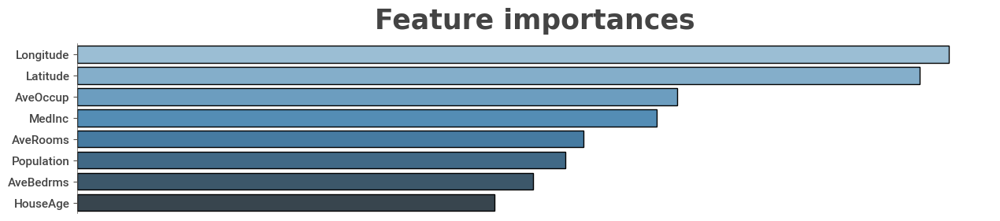

In [135]:
seed = 42
FOLDS = 3

lgb_params = {
    'max_depth': 9,
    'learning_rate': 0.01,
    'min_data_in_leaf': 36, 
    'num_leaves': 100, 
    'feature_fraction': 0.8, 
    'bagging_fraction': 0.89, 
    'bagging_freq': 5, 
    'lambda_l2': 28,
    
    'seed': seed,
    'objective': 'regression',
    'boosting_type': 'gbdt',
    'device': 'cpu', 
    'gpu_platform_id': 0,
    'gpu_device_id': 0,
    'n_jobs': -1,
    'metric': 'rmse',
    'verbose': -1
}

f_imp = pd.DataFrame({'feature': X.columns})
predictions, scores = np.zeros(len(test)), []

k = KFold(n_splits=FOLDS, random_state=seed, shuffle=True)
for fold, (train_idx, val_idx) in enumerate(k.split(X, y)):
    print(f'\n--- FOLD {fold+1} ---')
        
    lgb_train = lgb.Dataset(data=X.iloc[train_idx], 
                            label=y.iloc[train_idx])
    lgb_valid = lgb.Dataset(data=X.iloc[val_idx], 
                            label=y.iloc[val_idx],
                            reference=lgb_train)

    model = lgb.train(params=lgb_params, 
                      train_set=lgb_train, 
                      num_boost_round=50000,
                      valid_sets=[lgb_train, lgb_valid], 
                      valid_names=['train', 'val'],
                      verbose_eval=False,
                      callbacks=[lgb.log_evaluation(),
                                 lgb.early_stopping(100, verbose=False)])
    
    f_imp['fold_'+str(fold+1)] = model.feature_importance()
    b_itr = model.best_iteration
    
    val_preds = model.predict(X.iloc[val_idx], num_iteration=b_itr)
    val_score = rmse(y.iloc[val_idx], val_preds)
    scores.append(val_score)
    
    predictions += model.predict(X_test, num_iteration=b_itr) / FOLDS
    # print(f'--- RMSE: {round(val_score, 6)} | best iteration:{b_itr} ---')
    
    del lgb_train, lgb_valid, val_preds, val_score, model
    gc.collect()

print('*'*45)
print(f'Mean RMSE: {round(np.mean(scores), 6)}')

f_imp['avg_imp'] = f_imp[f_imp.columns[1:]].mean(axis=1)
f_imp.sort_values('avg_imp', ascending=False, inplace=True)
f_importance_plot(f_imp)

## Add extrnal data

## Evaluation stage